In [1]:
import os
import numpy as np
import scipy as sp
from matplotlib import pyplot as plt
import matplotlib
from datetime import datetime
import time
import pickle
import museek.util.tools as tl
import astropy.coordinates as ac
from astropy import units as u
import astropy
from astropy.wcs.utils import skycoord_to_pixel
import warnings

plt.style.use('classic')
plt.subplots_adjust(bottom=0.15,top=0.95,left=0.15,right=0.95)

from matplotlib import rcParams
#rcParams['font.family']='STIXGeneral'
params={'font.family':'DejaVu Serif',
        'font.serif':'Times New Roman',
        'font.style':'normal',
        'font.weight':'normal',
        }
rcParams.update(params)

matplotlib.rc('xtick', labelsize=16)
matplotlib.rc('ytick', labelsize=16)
matplotlib.rcParams['xtick.major.pad']='3'
matplotlib.rcParams['ytick.major.pad']='2'

<Figure size 640x480 with 0 Axes>

In [2]:
# load calibrated visibility
block_name = '1683492604'
data_path = '/idia/projects/hi_im/uhf_2023/pipeline_results/'
data_read = pickle.load(open(data_path+block_name+'/'+block_name+'_calibrated_visibility.pkl','rb'))
calibrated_vis = data_read['calibrated_visibility'] / 10**6.
antenna_list = data_read['antenna_list']
ra = data_read['ra']
dec = data_read['dec']
freq = data_read['freq'] / 10**6.
timestamps = data_read['timestamps']


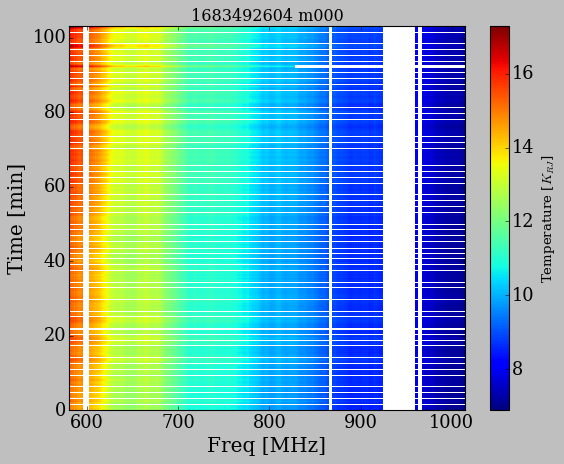

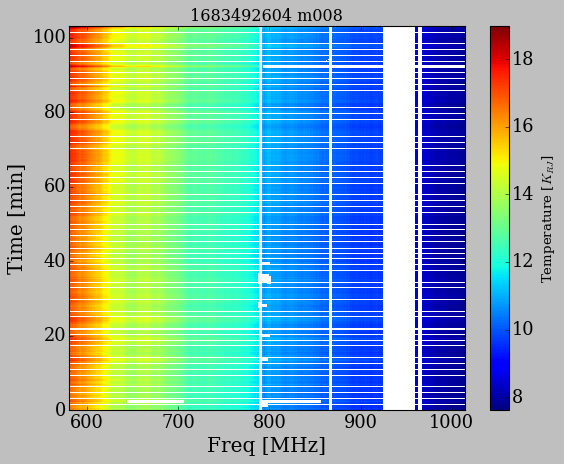

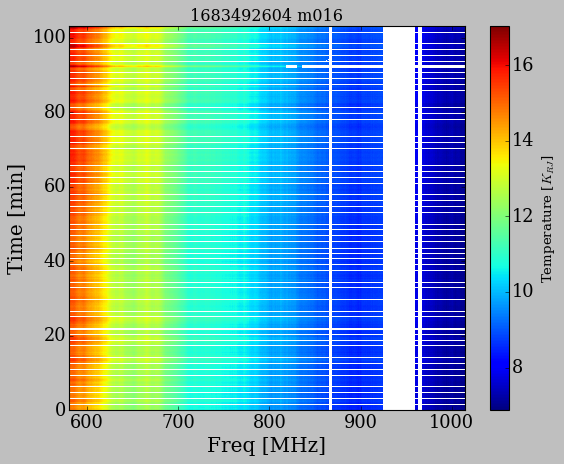

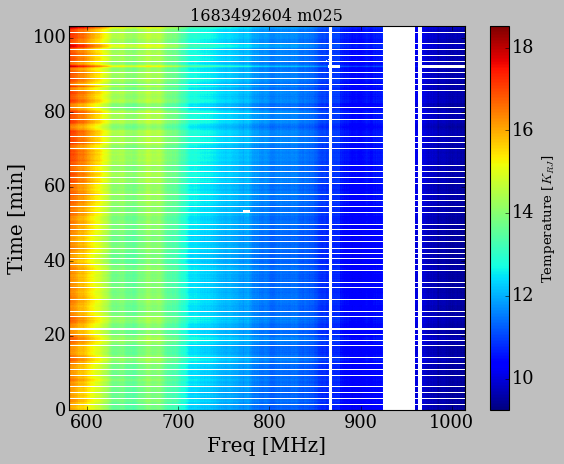

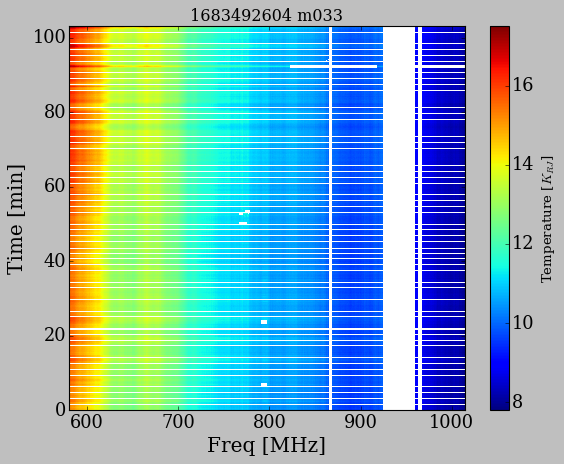

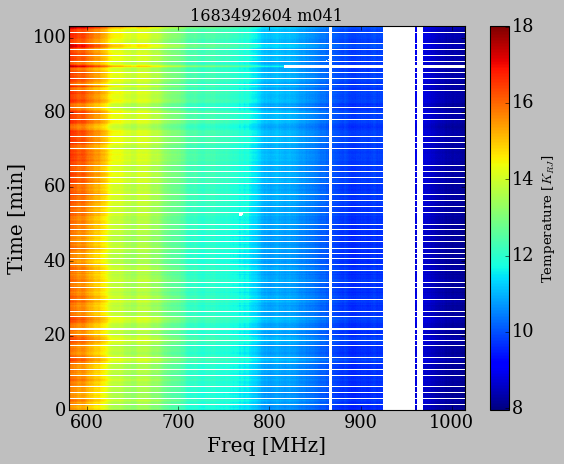

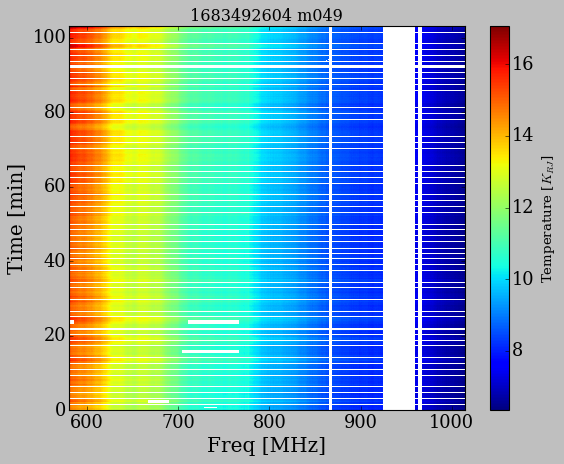

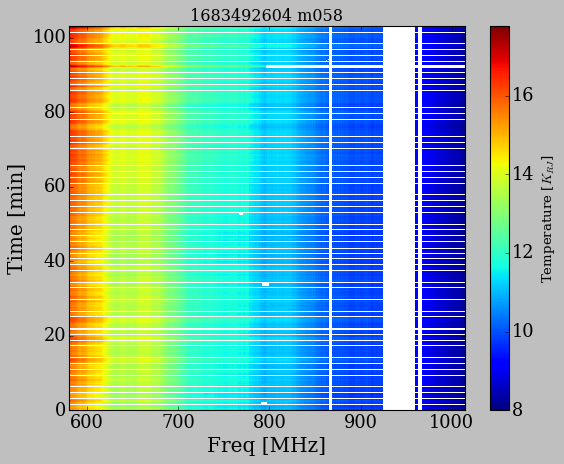

In [3]:
# check the waterfall map
for i_antenna, antenna in enumerate(antenna_list):
    plt.pcolormesh(freq, (timestamps-timestamps.min())/60,calibrated_vis[:,:,i_antenna])
    plt.colorbar(label=r'Temperature [$K_{RJ}$]')
    plt.ylabel('Time [min]', fontsize=18)
    plt.xlabel('Freq [MHz]', fontsize=18)
    plt.title(block_name+' '+antenna)
    plt.xlim(freq.min(), freq.max())
    plt.ylim(0, (timestamps.max()-timestamps.min())/60)
    #plt.savefig()
    plt.show()
    #plt.clf()
    plt.close()
    

m000 600MHz is masked


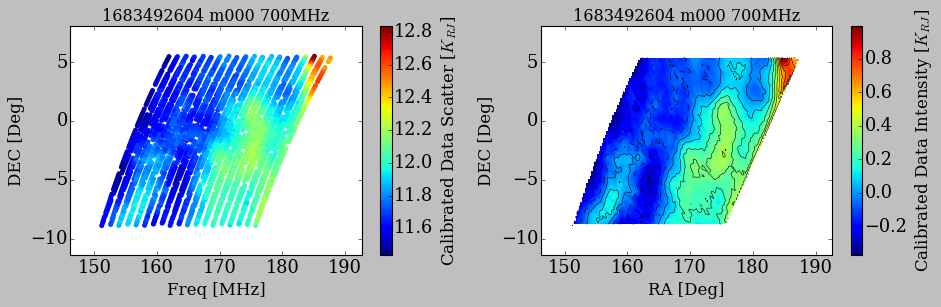

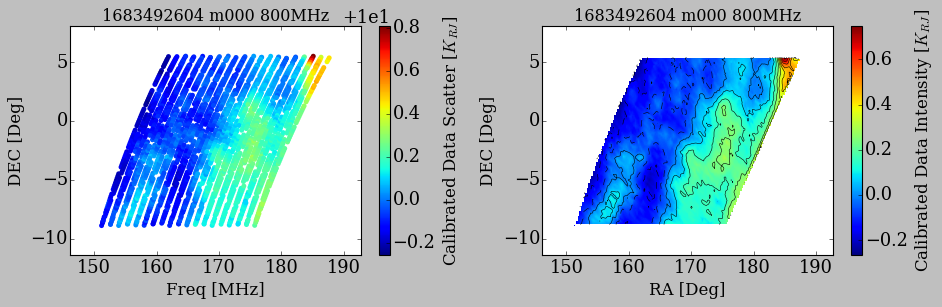

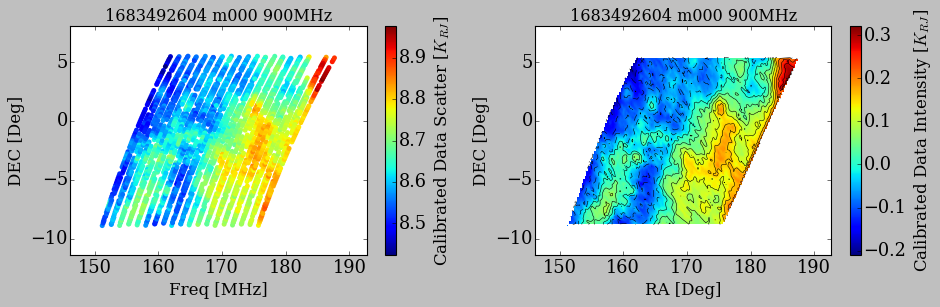

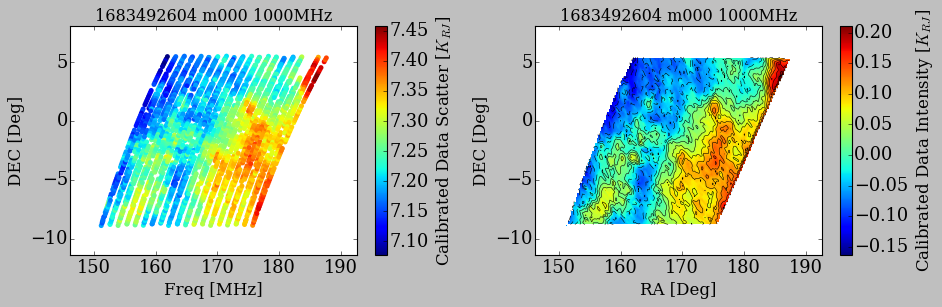

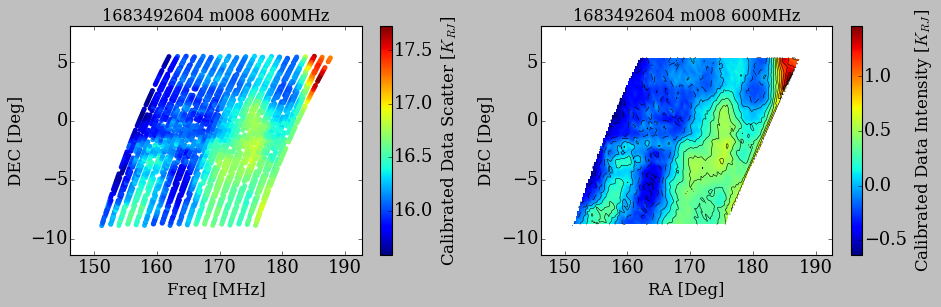

...

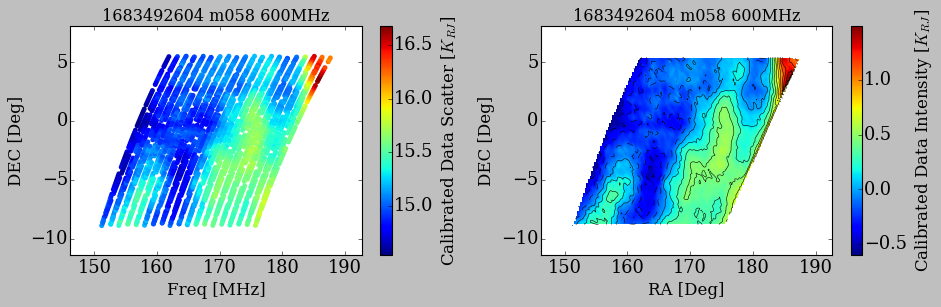

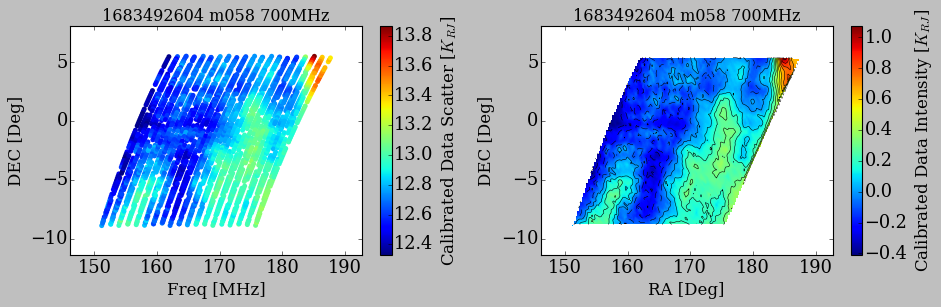

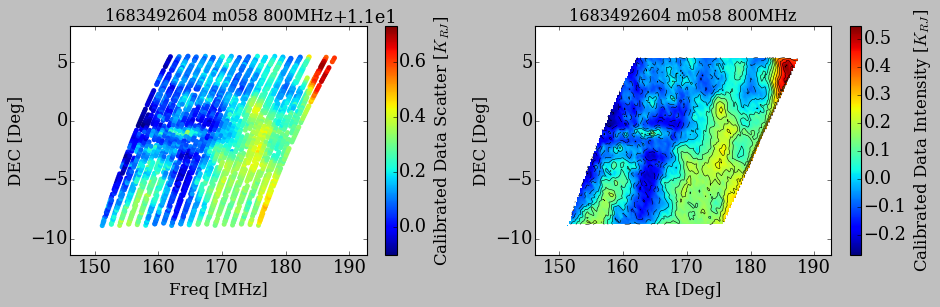

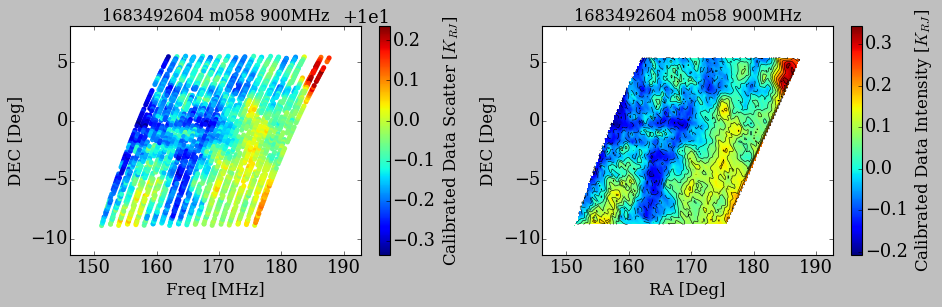

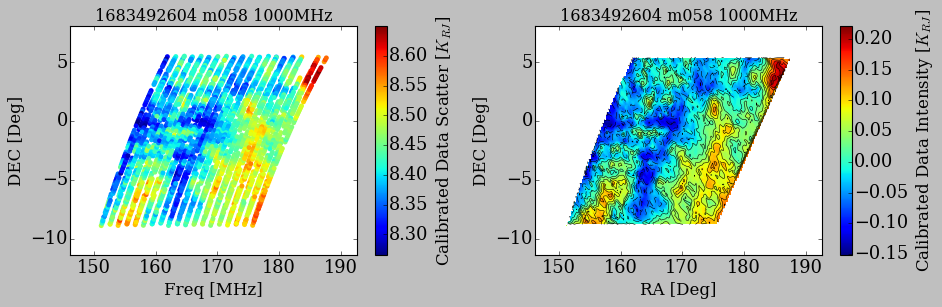

In [4]:
# check the scatter map and intesity (time median removed) map 

freq_plot_list = np.arange(600, 1020, 100)
for i_antenna, antenna in enumerate(antenna_list):
    for freq_plot in freq_plot_list:
        index_freq_plot = np.argmin(np.abs(freq-freq_plot))

        if np.sum(calibrated_vis[:,index_freq_plot,i_antenna].mask>0) == calibrated_vis[:,index_freq_plot,i_antenna].shape[0]:
            print (antenna + ' ' +str(freq_plot) + 'MHz is masked')
        else:
            fig = plt.figure(figsize=(12, 4))
        
            ax = fig.add_subplot(1, 2, 1)
            sc_data = ax.scatter(ra[:,i_antenna], dec[:,i_antenna], c=calibrated_vis[:,index_freq_plot,i_antenna], edgecolor='none', cmap='jet')
            ax.set_xlabel('Freq [MHz]', fontsize=15)
            ax.set_ylabel('DEC [Deg]', fontsize=15)
            ax.set_title(block_name+' '+antenna+' '+str(freq_plot) +'MHz')
            ax.set_xlim(ra.min()-5, ra.max()+5)
            ax.set_ylim(dec.min()-2.5, dec.max()+2.5)
            cbar_data = plt.colorbar(sc_data)
            cbar_data.set_label(r'Calibrated Data Scatter [$K_{RJ}$]', fontsize=15)
        
    
            ax = fig.add_subplot(1, 2, 2)
            mp_data = tl.plot_data(ra[:,i_antenna], dec[:,i_antenna], calibrated_vis[:,index_freq_plot,i_antenna] - np.ma.median(calibrated_vis[:,index_freq_plot,i_antenna]), gsize=150)
            plt.xlabel('RA [Deg]', fontsize=15)
            plt.ylabel('DEC [Deg]', fontsize=15)
            ax.set_title(block_name+' '+antenna+' '+str(freq_plot) +'MHz')
            ax.set_xlim(ra.min()-5, ra.max()+5)
            ax.set_ylim(dec.min()-2.5, dec.max()+2.5)
            cbar_mp = plt.colorbar(mp_data)
            cbar_mp.set_label(r'Calibrated Data Intensity [$K_{RJ}$]', fontsize=15)
            plt.tight_layout()
            plt.show()
            #plt.savefig()
            #plt.clf()
            plt.close()


In [ ]:
#Below is the module for map-making

In [5]:
# define the function to project the calibrated visibility on a 2D grid

def project_2d(x, y, data, shape, weights=None):
    """Project x,y, data TOIs on a 2D grid.

    Parameters
    ----------
    x, y : array_like
        input pixel indexes, 0 indexed convention
    data : array_like
        input data to project
    shape : int or tuple of int
        the shape of the output projected map
    weights : array_like
        weights to be use to sum the data (by default, ones)

    Returns
    -------
    data, weight, hits : ndarray
        the projected data set and corresponding weights and hits

    Notes
    -----
    The pixel index must follow the 0 indexed convention, i.e. use `origin=0` in `*_worl2pix` methods from `~astropy.wcs.WCS`.

    >>> data, weight, hits = project([0], [0], [1], 2)
    >>> data
    array([[ 1., nan],
           [nan, nan]])
    >>> weight
    array([[1., 0.],
           [0., 0.]])
    >>> hits
    array([[1, 0],
           [0, 0]]))

    >>> data, _, _ = project([-0.4], [0], [1], 2)
    >>> data
    array([[ 1., nan],
           [nan, nan]])

    There is no test for out of shape data

    >>> data, _, _ = project([-0.6, 1.6], [0, 0], [1, 1], 2)
    >>> data
    array([[nan, nan],
           [nan, nan]])

    Weighted means are also possible :

    >>> data, weight, hits = project([-0.4, 0.4], [0, 0], [0.5, 2], 2, weights=[2, 1])
    >>> data
    array([[ 1., nan],
           [nan, nan]))
    >>> weight
    array([[3., 0.],
           [0., 0.]])
    >>> hits
    array([[2, 0],
           [0, 0]])
    """
    if isinstance(shape, (int, np.integer)):
        shape = (shape, shape)

    assert len(shape) == 2, "shape must be a int or have a length of 2"

    if not isinstance(data, np.ndarray):
        data = np.asarray(data)

    if weights is None:
        weights = np.ones(data.shape)

    if isinstance(data, np.ma.MaskedArray):
        # Put weights as 0 for masked data
        hit_weights = ~data.mask
        weights = weights * hit_weights
    else:
        hit_weights = np.ones_like(data, dtype=bool)

    kwargs = {"bins": shape, "range": tuple((-0.5, size - 0.5) for size in shape)}

    _hits, xedges, yedges = np.histogram2d(y, x, weights=hit_weights, **kwargs)
    _weights = np.histogram2d(y, x, weights=weights, **kwargs)[0]
    _data = np.histogram2d(y, x, weights=weights * data, **kwargs)[0]

    with warnings.catch_warnings():
        warnings.simplefilter("ignore")
        output = _data / _weights

    return output, _weights, _hits.astype(int), xedges, yedges
    

def project_3d(x, y, z, data, shape, weights=None, weighted_output=False):
    """Project x,y, data TOIs on a 2D grid.

    Parameters
    ----------
    x, y, z : array_like
        input pixel indexes, 0 indexed convention
    data : array_like
        input data to project
    shape : int or tuple of int
        the shape of the output projected map
    weights : array_like
        weights to be use to sum the data (by default, ones)
    weighted_output : bool
        if True, return the weighted output instead of normalized output, by default False

    Returns
    -------
    data, weight, hits : ndarray
        the projected data set and corresponding weights and hits

    Notes
    -----
    The pixel index must follow the 0 indexed convention, i.e. use `origin=0` in `*_worl2pix` methods from `~astropy.wcs.WCS`.

    """
    if isinstance(shape, (int, np.integer)):
        shape = (shape, shape, shape)
    if len(shape) == 2:
        shape = (shape[0], shape[1], shape[1])

    assert len(shape) == 3, "shape must be a int or have a length of 2 or 3"

    if not isinstance(data, np.ndarray):
        data = np.asarray(data)

    if weights is None:
        weights = np.ones_like(data)

    if isinstance(data, np.ma.MaskedArray):
        # Put weights as 0 for masked data
        hit_weights = ~data.mask
        weights = weights * hit_weights
    else:
        hit_weights = np.ones_like(data, dtype=bool)
        
    kwargs = {
        "bins": shape,
        "range": tuple((-0.5, float(size) - 0.5) for size in shape),
    }

    sample = (z, y, x)
    _hits = np.histogramdd(sample, weights=hit_weights, **kwargs)[0]
    _weights = np.histogramdd(sample, weights=weights, **kwargs)[0]
    _data = np.histogramdd(sample, weights=weights * data, **kwargs)[0]

    if not weighted_output:
        with warnings.catch_warnings():
            warnings.simplefilter("ignore")
            _data /= _weights

    return _data, _weights, _hits.astype(int)

In [6]:
# define the wcs for map 

from astropy.wcs import WCS
import numpy as np

# Create a new WCS object with two dimensions
wcs = WCS(naxis=2)

pix_reso = 0.5 #  map resolution deg

x_min = ra.min()-2.  # map region 
x_max = ra.max()+2.  # map region
y_min = dec.min()-2.  # map region
y_max = dec.max()+2.  # map region

crpix_x=int((x_max-x_min)/pix_reso/2.)
crpix_y=int((y_max-y_min)/pix_reso/2.)

# Assuming the RA ad Dec axis are the first and second axis respectively
# Define the reference pixel (center of the array or some other reference)
wcs.wcs.crpix = [crpix_x, crpix_y]  # Middle of the array
wcs.wcs.cdelt = np.array([pix_reso, pix_reso])  # degrees/pixel for RA and Dec
wcs.wcs.crval = [(x_max+x_min)/2., (y_max+y_min)/2.] 
wcs.wcs.ctype = ["RA---ZEA", "DEC--ZEA"]  # Use ZEA projection for RA and Dec

# Optionally set unit types
wcs.wcs.cunit = ['deg', 'deg']

# Display the WCS header to check
print('wcs', wcs)

# set the shape of map 
shape = (np.round((x_max-x_min)/pix_reso).astype(int) + 1, np.round((y_max-y_min)/pix_reso).astype(int) + 1)


wcs WCS Keywords

Number of WCS axes: 2
CTYPE : 'RA---ZEA'  'DEC--ZEA'  
CRVAL : 169.41764094239332  -1.652300102049232  
CRPIX : 40.0  18.0  
PC1_1 PC1_2  : 1.0  0.0  
PC2_1 PC2_2  : 0.0  1.0  
CDELT : 0.5  0.5  
NAXIS : 0  0


In [8]:
# project the calibrated data on the defined 2D grid, 

map_making_data = np.ones((shape[0], shape[1], len(freq), len(antenna_list)))
hit_data = np.ones((shape[0], shape[1], len(freq), len(antenna_list)))

for i_antenna, antenna in enumerate(antenna_list):
    
    sky_sc=ac.SkyCoord(ra=ra[:,i_antenna]*u.deg, dec=dec[:,i_antenna]*u.deg) #pointings in observation
    pix_coords=skycoord_to_pixel(sky_sc, wcs)

    for i_freq, freq_value in enumerate(freq):
        
        data = calibrated_vis[:,i_freq,i_antenna] - np.ma.median(calibrated_vis[:,i_freq,i_antenna])
        output, weight, hit, xedges, yedges = project_2d(pix_coords[1], pix_coords[0], data.flatten(), shape, weights=None)
        map_making_data[:,:,i_freq,i_antenna] = output
        hit_data[:,:,i_freq,i_antenna] = hit
        
map_making_data = np.ma.masked_array(map_making_data, mask=np.isnan(map_making_data))
hit_data = np.ma.masked_array(hit_data, mask=np.isnan(map_making_data))

In [9]:
x_pix_coords = xedges[1:] - np.diff(xedges)[0]/2.
y_pix_coords = yedges[1:] - np.diff(yedges)[0]/2.
x_sky_coords = wcs.wcs.crval[0] + (x_pix_coords - wcs.wcs.crpix[0]) * wcs.wcs.cdelt[0]
y_sky_coords = wcs.wcs.crval[1] + (y_pix_coords - wcs.wcs.crpix[1]) * wcs.wcs.cdelt[1]

x_sky_coords, y_sky_coords = np.meshgrid(x_sky_coords, y_sky_coords)

arrays_dict = {
            'map': map_making_data,
            'hit': hit_data,
            'ra':x_sky_coords,
            'dec':y_sky_coords,
            'freq':freq,
            'antenna_list':antenna_list,
            }

output_path = '/idia/projects/hi_im/uhf_2023/maps/'+block_name+'/'
if not os.path.exists(output_path):
    os.makedirs(output_path)
    print(f"Directory '{output_path}' was created.")
else:
    print(f"Directory '{output_path}' already exists.")
    
with open(output_path+'/'+block_name+'_map_making.pkl', 'wb') as f:
    pickle.dump(arrays_dict, f)

Directory '/idia/projects/hi_im/uhf_2023/maps/1683492604/' already exists.


m000 600MHz is masked


/users/wkhu/environment/museek/lib/python3.10/site-packages/matplotlib/cbook.py:1699: UserWarning: Warning: converting a masked element to nan.
  return math.isfinite(val)


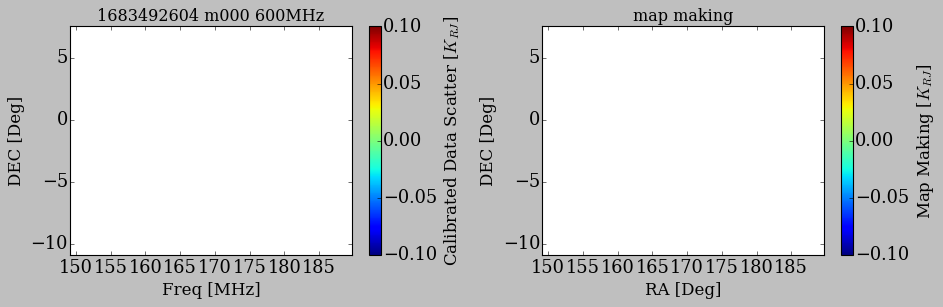

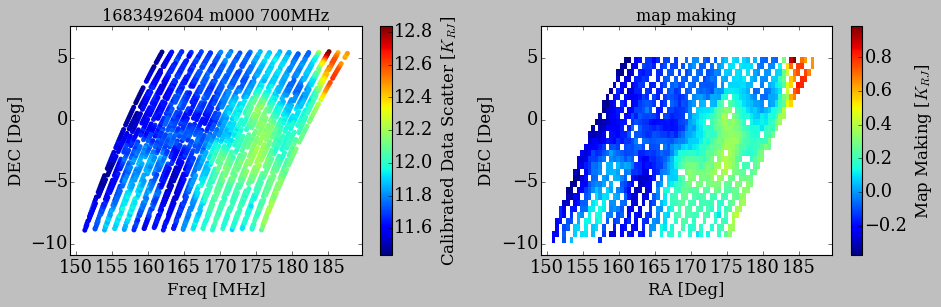

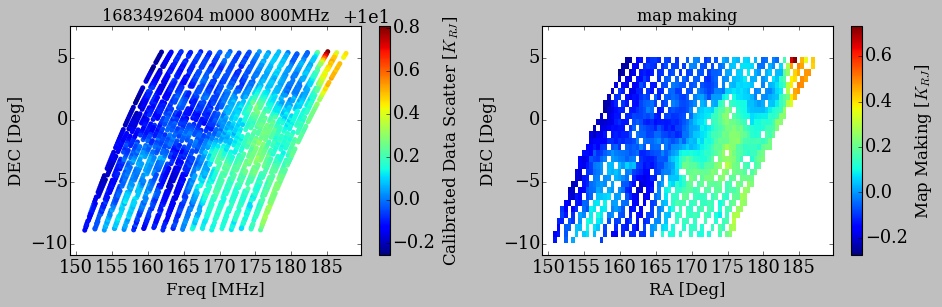

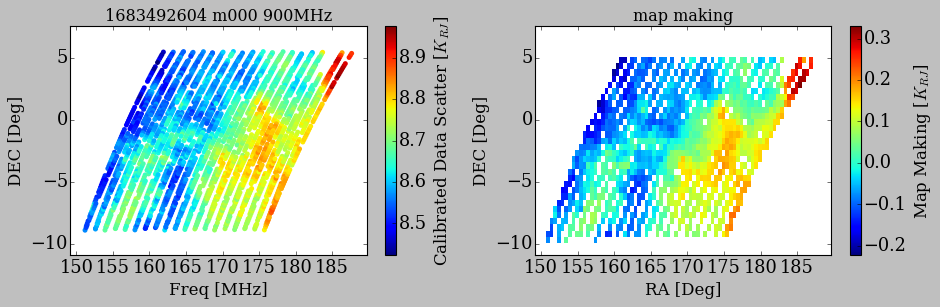

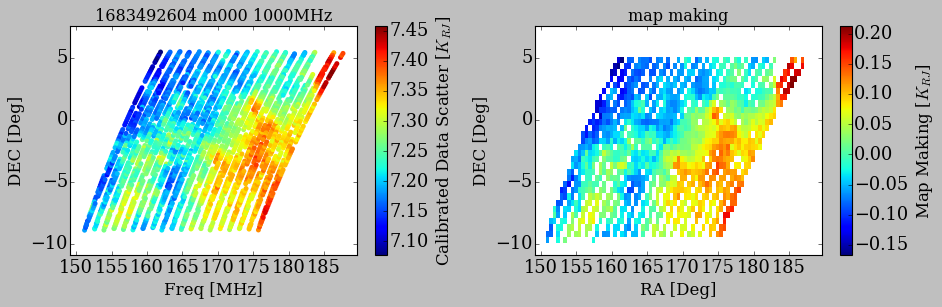

...

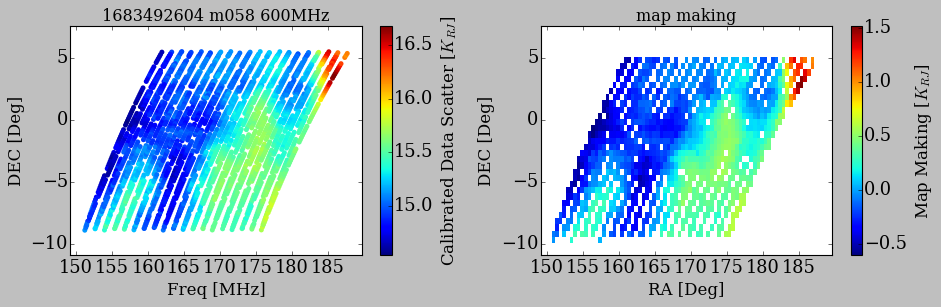

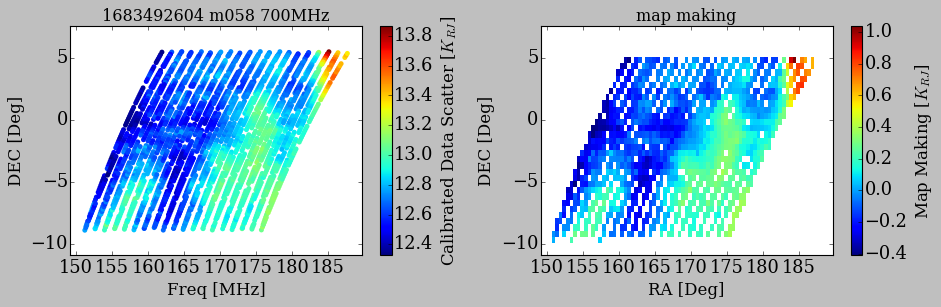

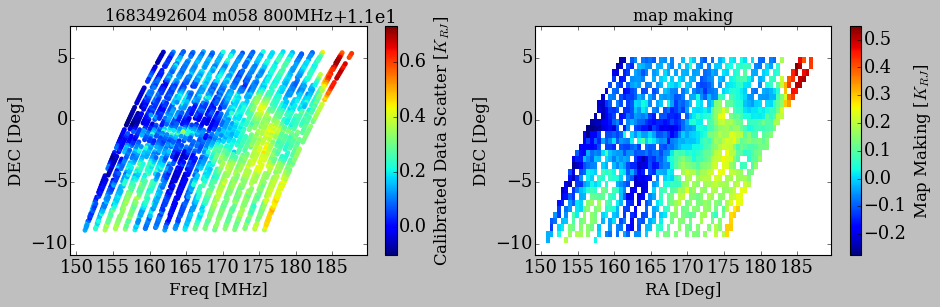

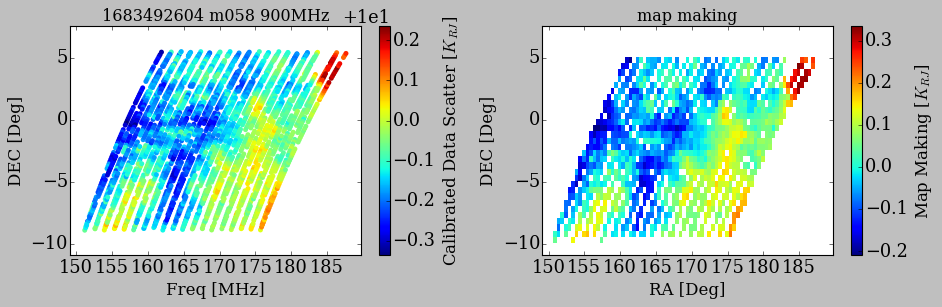

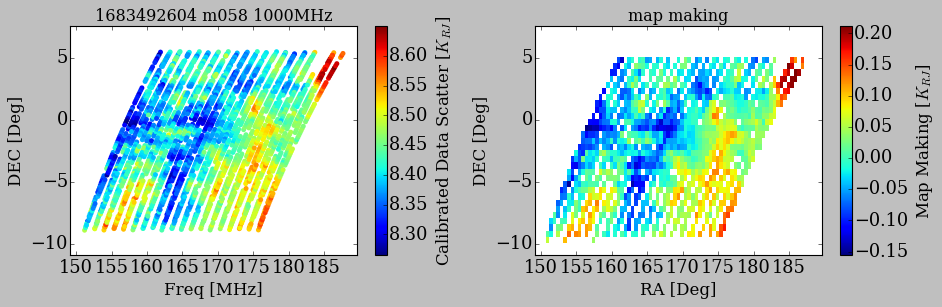

In [10]:
freq_plot_list = np.arange(600, 1020, 100)

for i_antenna, antenna in enumerate(antenna_list):
    for freq_plot in freq_plot_list:
        index_freq_plot = np.argmin(np.abs(freq-freq_plot))

        if np.sum(calibrated_vis[:,index_freq_plot,i_antenna].mask>0) == calibrated_vis[:,index_freq_plot,i_antenna].shape[0]:
            print (antenna + ' ' +str(freq_plot) + 'MHz is masked')
        else:
            pass

        fig = plt.figure(figsize=(12, 4))
        
        ax = fig.add_subplot(1, 2, 1)
        sc_data = ax.scatter(ra[:,i_antenna], dec[:,i_antenna], c=calibrated_vis[:,index_freq_plot,i_antenna], edgecolor='none', cmap='jet')
        ax.set_xlabel('Freq [MHz]', fontsize=15)
        ax.set_ylabel('DEC [Deg]', fontsize=15)
        ax.set_title(block_name+' '+antenna+' '+str(freq_plot) +'MHz')
        ax.set_xlim(ra.min()-2., ra.max()+2.)
        ax.set_ylim(dec.min()-2., dec.max()+2.)
        cbar_data = plt.colorbar(sc_data)
        cbar_data.set_label(r'Calibrated Data Scatter [$K_{RJ}$]', fontsize=15)
            
        
        ax = fig.add_subplot(1, 2, 2)
        mk_data = plt.pcolormesh(x_sky_coords, y_sky_coords, map_making_data[:,:,index_freq_plot,i_antenna].T)
        plt.xlabel('RA [Deg]', fontsize=15)
        plt.ylabel('DEC [Deg]', fontsize=15)
        ax.set_title('map making')
        ax.set_xlim(ra.min()-2., ra.max()+2.)
        ax.set_ylim(dec.min()-2., dec.max()+2.)
        cbar_mp = plt.colorbar(mk_data)
        cbar_mp.set_label(r'Map Making [$K_{RJ}$]', fontsize=15)
        plt.tight_layout()
        plt.show()
        #plt.savefig()
        #plt.clf()
        plt.close()